#Historical Min temperature per month all over the world for the years 1970-2000.

####Importing the required libraries

In [1]:
import cv2
!pip install matplotlib
import matplotlib.pyplot as plt
import os
import numpy as np
import time
!pip install rasterio
import rasterio
import pandas as pd
from PIL import Image
import skimage
%matplotlib inline

     |████████████████████████████████| 18.1MB 209kB/s 


####Uploading the 12 tiff images for each month to colab.
####The images have a spatial resolution of 10 minutes.

In [2]:
from google.colab import files
files.upload()

Saving wc2.1_10m_tavg_01.tif to wc2.1_10m_tavg_01.tif
Saving wc2.1_10m_tavg_02.tif to wc2.1_10m_tavg_02.tif
Saving wc2.1_10m_tavg_03.tif to wc2.1_10m_tavg_03.tif
Saving wc2.1_10m_tavg_04.tif to wc2.1_10m_tavg_04.tif
Saving wc2.1_10m_tavg_05.tif to wc2.1_10m_tavg_05.tif
Saving wc2.1_10m_tavg_06.tif to wc2.1_10m_tavg_06.tif
Saving wc2.1_10m_tavg_07.tif to wc2.1_10m_tavg_07.tif
Saving wc2.1_10m_tavg_08.tif to wc2.1_10m_tavg_08.tif
Saving wc2.1_10m_tavg_09.tif to wc2.1_10m_tavg_09.tif
Saving wc2.1_10m_tavg_10.tif to wc2.1_10m_tavg_10.tif
Saving wc2.1_10m_tavg_11.tif to wc2.1_10m_tavg_11.tif
Saving wc2.1_10m_tavg_12.tif to wc2.1_10m_tavg_12.tif


####Some basic analysis to determine the nature, masks on image , meta data of image on one image.

In [3]:
import numpy
src1 = rasterio.open("/content/wc2.1_10m_tavg_01.tif")
print (src1.shape)
print (type(src1))
array1=src1.read(1)
with numpy.printoptions(threshold=1000):
    print(array1)
#print ("array:\n",array1)
print (src1.meta)
b = src1.dataset_mask()
print (b)
print ("Mean:-",np.mean(array1))
print ("Median:-",np.mean(array1))
print ("Variance:-",np.var(array1))
print ("Standard Deviation:-",np.std(array1))
print ("QUARTILES")
print ("25% Quantile:-",np.quantile(array1,0.25))
print ("50% Quantile:-",np.quantile(array1,0.50))
print ("75% Quantile:-",np.quantile(array1,0.75))
print ("90% Quantile:-",np.quantile(array1,0.90))
print ("95% Quantile:-",np.quantile(array1,0.95))
print ("99% Quantile:-",np.quantile(array1,0.99))
print ("min Quantile:-",np.quantile(array1,0))
print ("max Quantile:-",np.quantile(array1,1))

(1080, 2160)
<class 'rasterio.io.DatasetReader'>
[[-3.4000000e+38 -3.4000000e+38 -3.4000000e+38 ... -3.4000000e+38
  -3.4000000e+38 -3.4000000e+38]
 [-3.4000000e+38 -3.4000000e+38 -3.4000000e+38 ... -3.4000000e+38
  -3.4000000e+38 -3.4000000e+38]
 [-3.4000000e+38 -3.4000000e+38 -3.4000000e+38 ... -3.4000000e+38
  -3.4000000e+38 -3.4000000e+38]
 ...
 [-1.8879749e+01 -1.9530001e+01 -1.9530750e+01 ... -2.1501499e+01
  -2.1495251e+01 -2.0174749e+01]
 [-1.6990000e+01 -1.7920000e+01 -1.7920000e+01 ... -1.9740000e+01
  -1.9732750e+01 -1.8200251e+01]
 [-1.7273500e+01 -1.7862499e+01 -1.7880001e+01 ... -1.9684750e+01
  -1.9672251e+01 -1.8493999e+01]]
{'driver': 'GTiff', 'dtype': 'float32', 'nodata': -3.4e+38, 'width': 2160, 'height': 1080, 'count': 1, 'crs': CRS.from_epsg(4326), 'transform': Affine(0.16666666666666666, 0.0, -180.0,
       0.0, -0.16666666666666666, 90.0)}
[[  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 [  0   0   0 ...   0   0   0]
 ...
 [255 255 255 ... 255 255 2

/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:151: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims)
/usr/local/lib/python3.6/dist-packages/numpy/core/_methods.py:183: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True)


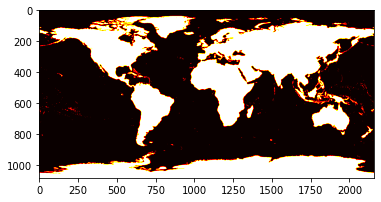

(-3.4e+38,)
('float32',)


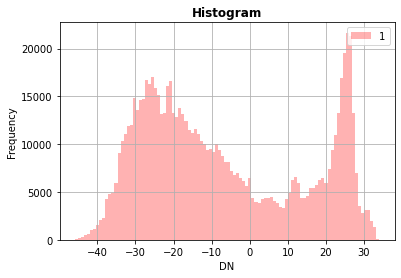

In [4]:
import rasterio
from matplotlib import pyplot
src = rasterio.open("/content/wc2.1_10m_tavg_01.tif")
pyplot.imshow(src.read(1), cmap='hot')
pyplot.show()
print (src.nodatavals)
print (src.dtypes)
src.nodata
msk = src.read_masks(1)
msk.shape
msk
from rasterio.plot import show_hist
show_hist(src, bins=100, lw=0.0, stacked=False, alpha=0.3,histtype='stepfilled', title="Histogram")

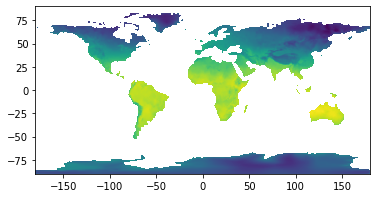

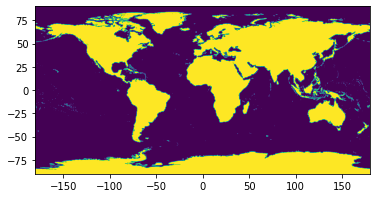

In [5]:
from rasterio.plot import show
show(src)
show(src.read(), transform=src.transform)


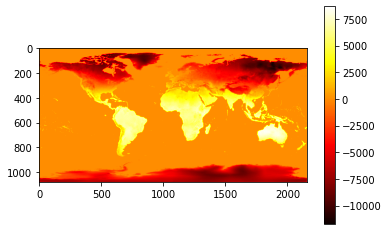

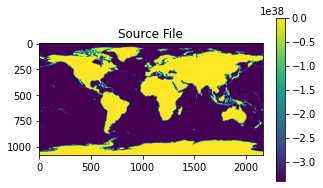

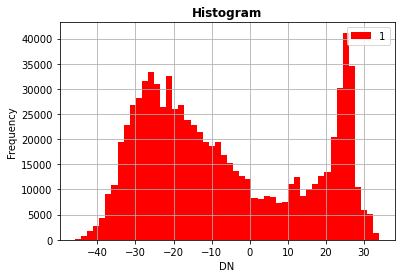

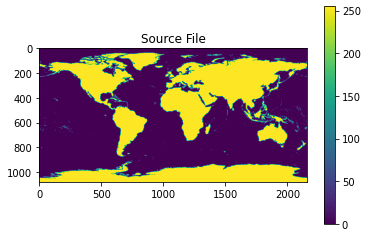

(array([[1009.,    0.,    0., ...,    0.,    0.,   71.],
        [1014.,    0.,    0., ...,    0.,    0.,   66.],
        [1016.,    0.,    0., ...,    0.,    0.,   64.],
        ...,
        [1004.,    0.,    0., ...,    0.,    0.,   76.],
        [1007.,    0.,    0., ...,    0.,    0.,   73.],
        [1006.,    0.,    0., ...,    0.,    0.,   74.]]),
 array([-3.4000000e+38, -3.0600000e+38, -2.7199999e+38, -2.3800000e+38,
        -2.0399999e+38, -1.7000000e+38, -1.3600000e+38, -1.0199999e+38,
        -6.7999998e+37, -3.3999999e+37,  3.4009499e+01], dtype=float32),
 <a list of 2160 Lists of Patches objects>)

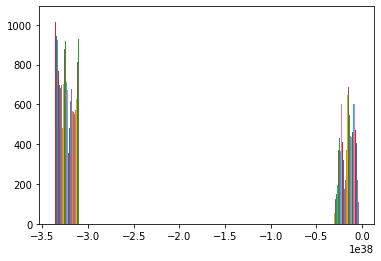

In [7]:
plt.imshow(array1*b,cmap='hot')
plt.colorbar()
plt.show()
src = rasterio.open("/content/wc2.1_10m_tavg_01.tif")
plt.figure(figsize=(5,3), facecolor='None')
img = plt.imshow(src.read(1))
plt.colorbar(img)
plt.title("Source File")
plt.show()
from rasterio.plot import show_hist
show_hist(src,bins=50)
x = plt.imshow(b)
plt.colorbar(x)
plt.title("Source File")
plt.show()
plt.hist(array1)

####Trying out different colormaps to chose which one fits.

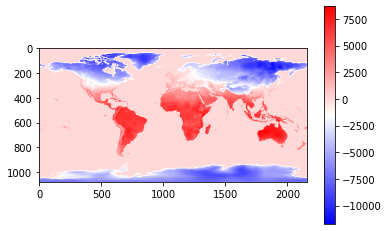

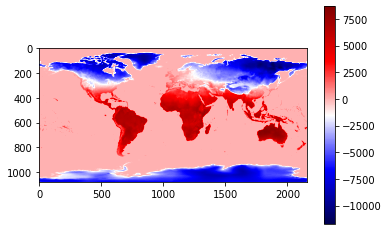

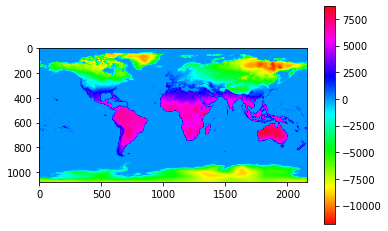

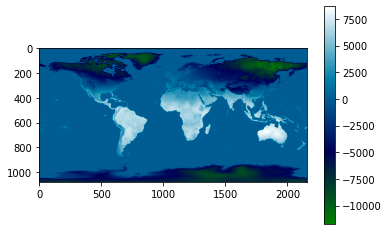

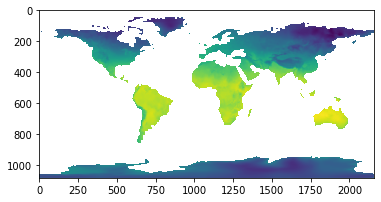

In [8]:
a=['bwr', 'seismic', 'hsv','ocean']
for i in range(len(a)):
    plt.imshow(array1*b,cmap=a[i])
    plt.colorbar()
    plt.show()
from rasterio.plot import show
a = show(rasterio.open("/content/wc2.1_10m_tavg_01.tif"),with_bounds=False,contour=False,adjust="None")


####Plotting all the 12 tiff images from jan to dec representing the min temp during each month.

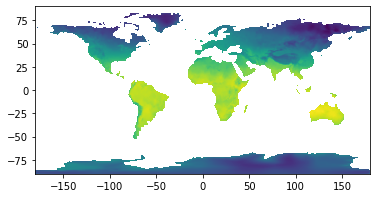

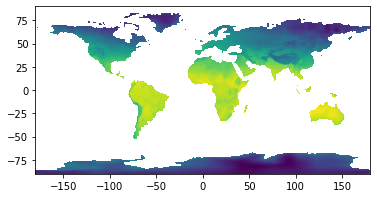

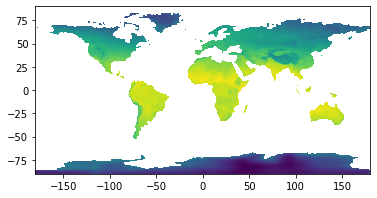

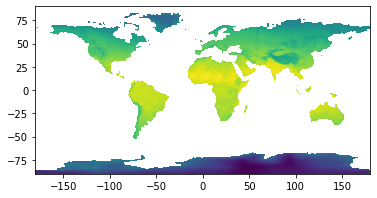

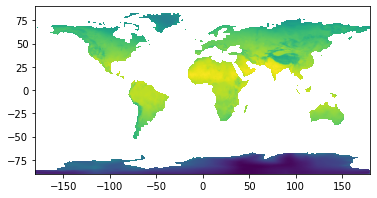

...

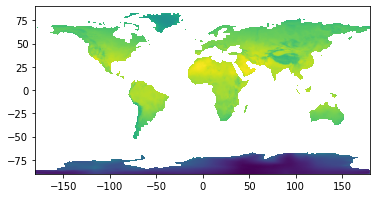

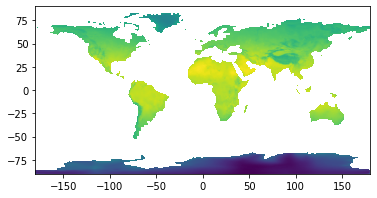

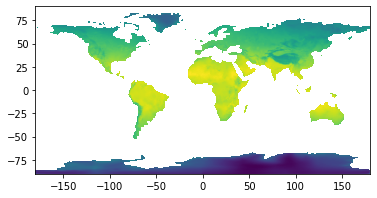

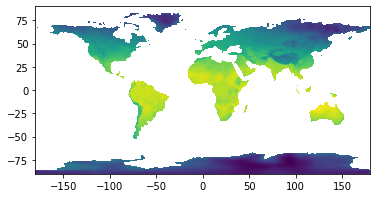

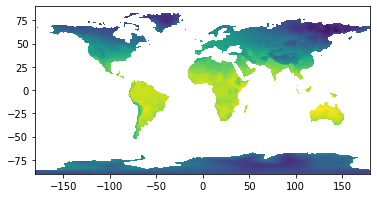

In [9]:
from rasterio.plot import show
show(rasterio.open("/content/wc2.1_10m_tavg_01.tif"),with_bounds=True)
show(rasterio.open("/content/wc2.1_10m_tavg_02.tif"),with_bounds=True)
show(rasterio.open("/content/wc2.1_10m_tavg_03.tif"),with_bounds=True)
show(rasterio.open("/content/wc2.1_10m_tavg_04.tif"),with_bounds=True)
show(rasterio.open("/content/wc2.1_10m_tavg_05.tif"),with_bounds=True)
show(rasterio.open("/content/wc2.1_10m_tavg_06.tif"),with_bounds=True)
show(rasterio.open("/content/wc2.1_10m_tavg_07.tif"),with_bounds=True)
show(rasterio.open("/content/wc2.1_10m_tavg_08.tif"),with_bounds=True)
show(rasterio.open("/content/wc2.1_10m_tavg_09.tif"),with_bounds=True)
show(rasterio.open("/content/wc2.1_10m_tavg_10.tif"),with_bounds=True)
show(rasterio.open("/content/wc2.1_10m_tavg_11.tif"),with_bounds=True)
show(rasterio.open("/content/wc2.1_10m_tavg_12.tif"),with_bounds=True)



####Plotting the 12 images with a better visualisation monthwise.

AxesImage(486,243;2410.56x1467.72)
AxesImage(486,243;2410.56x1467.72)
AxesImage(486,243;2410.56x1467.72)
AxesImage(486,243;2410.56x1467.72)
AxesImage(486,243;2410.56x1467.72)
AxesImage(486,243;2410.56x1467.72)
AxesImage(486,243;2410.56x1467.72)
AxesImage(486,243;2410.56x1467.72)
AxesImage(486,243;2410.56x1467.72)
AxesImage(486,243;2410.56x1467.72)
AxesImage(486,243;2410.56x1467.72)
AxesImage(486,243;2410.56x1467.72)


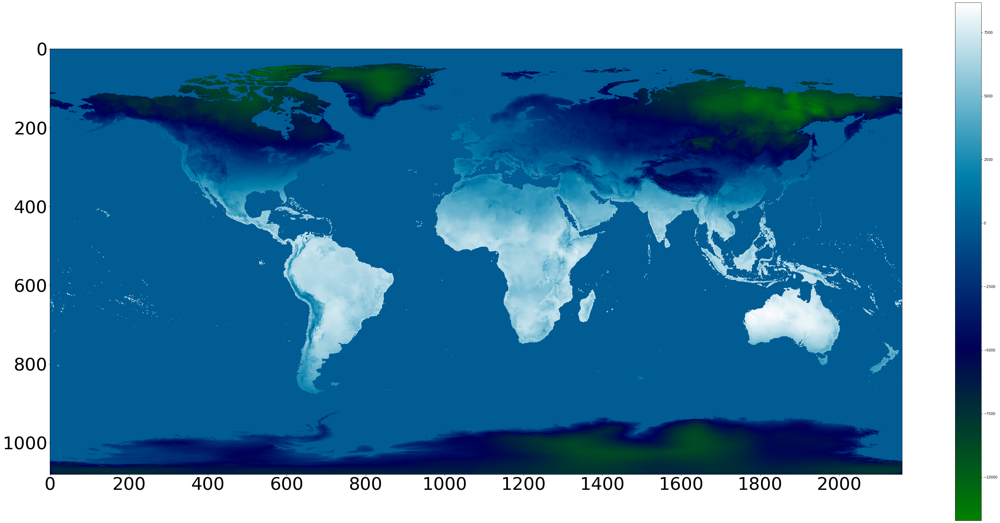

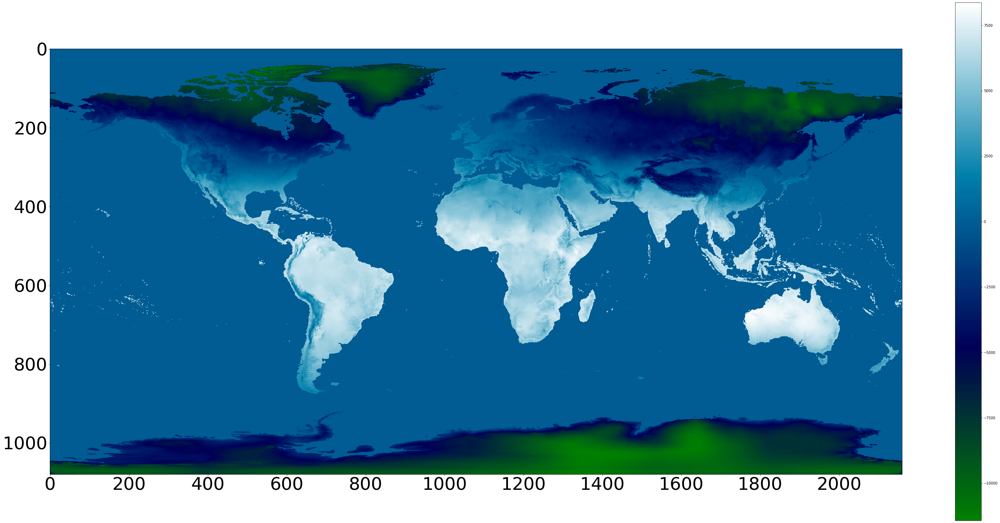

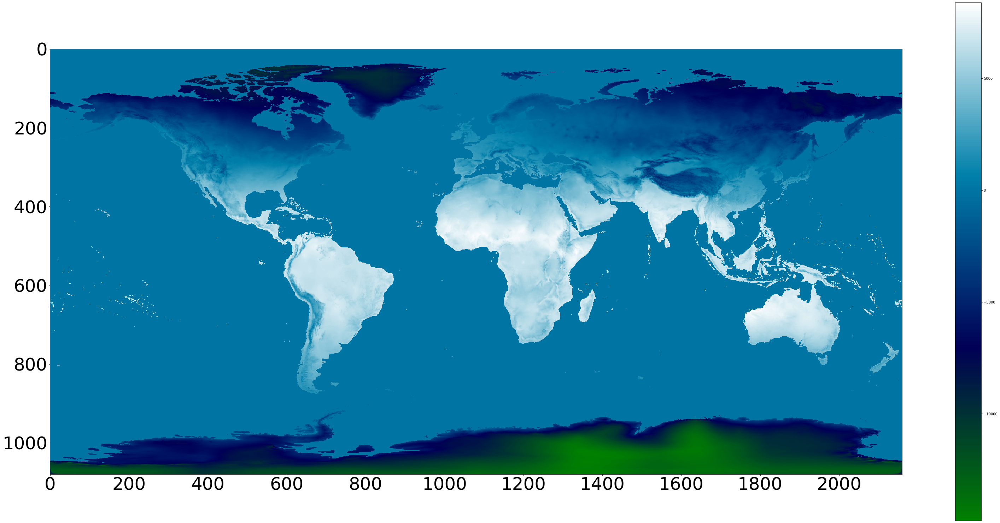

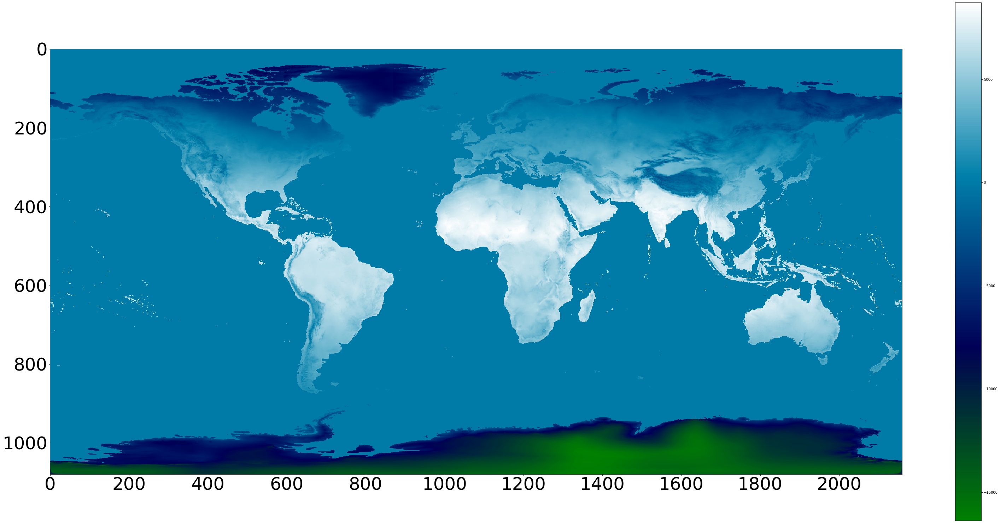

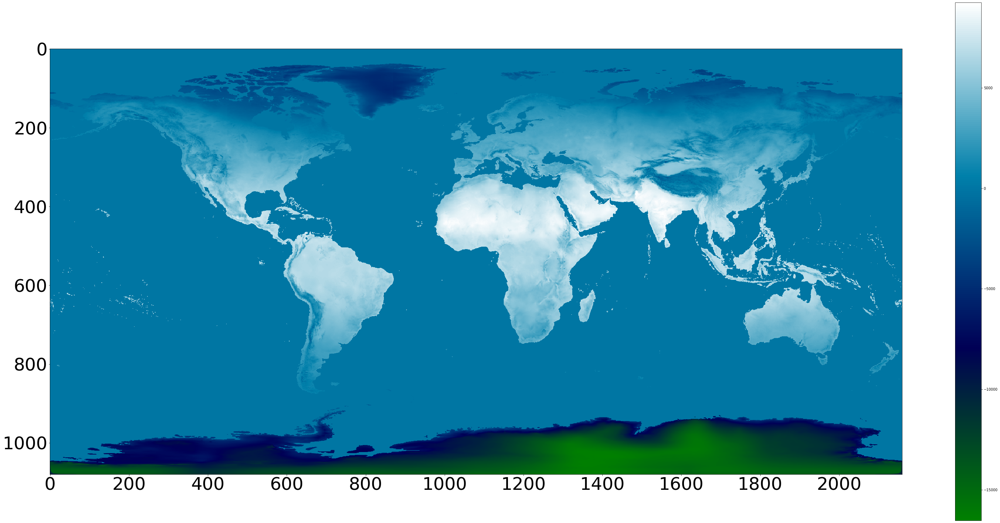

...

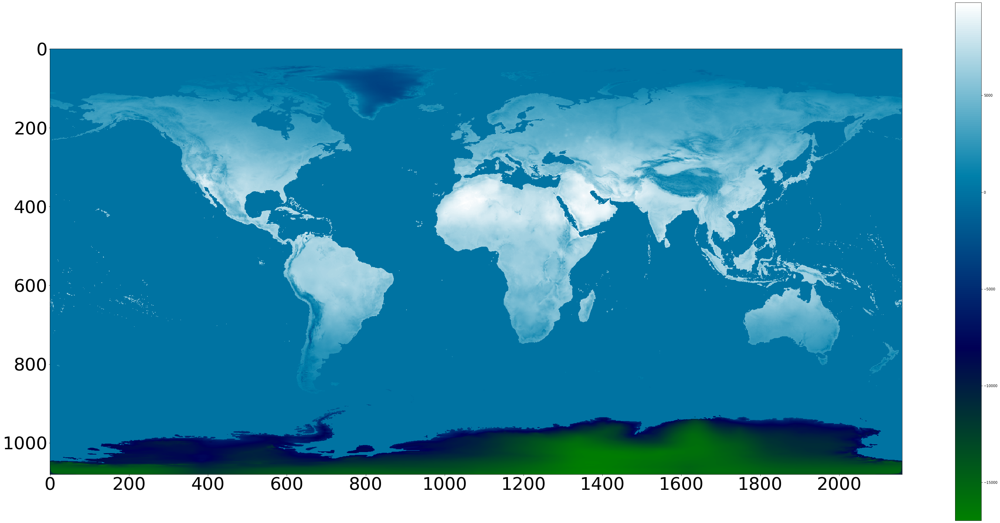

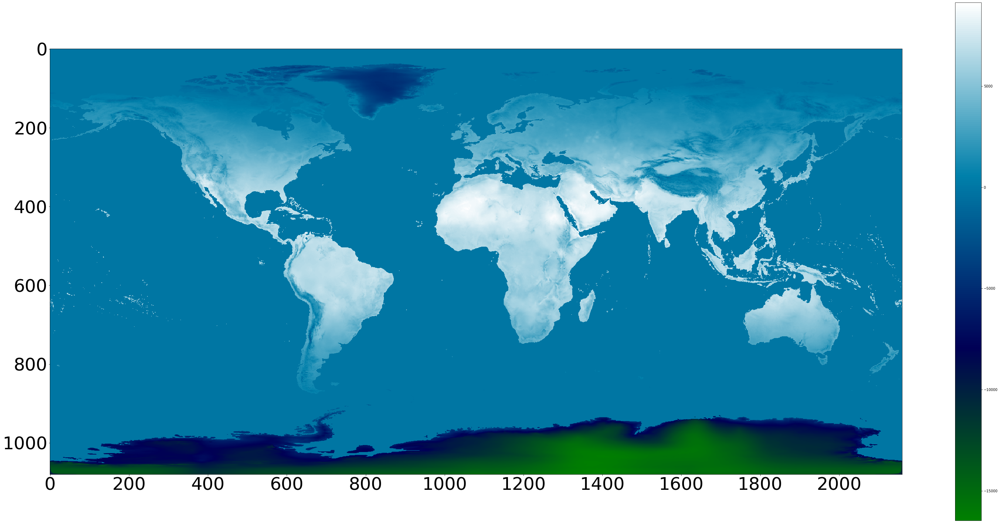

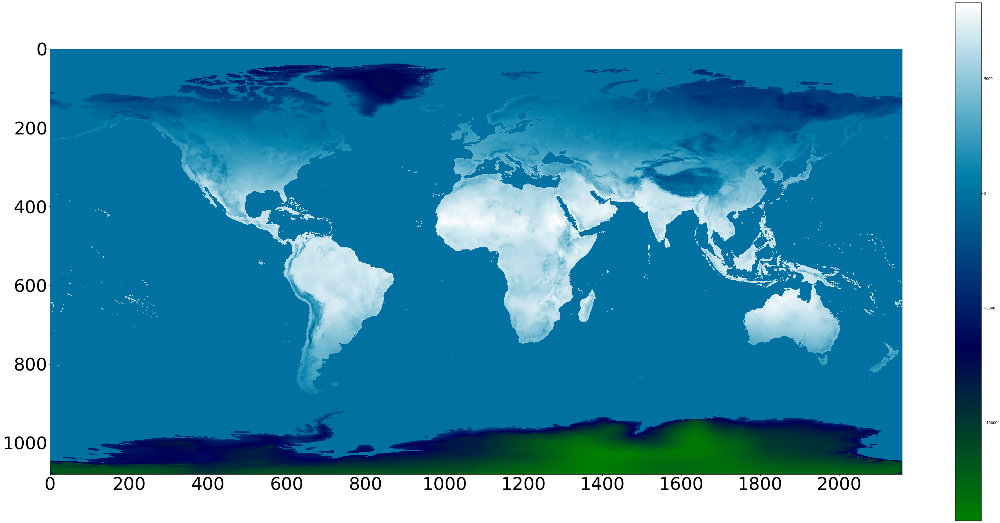

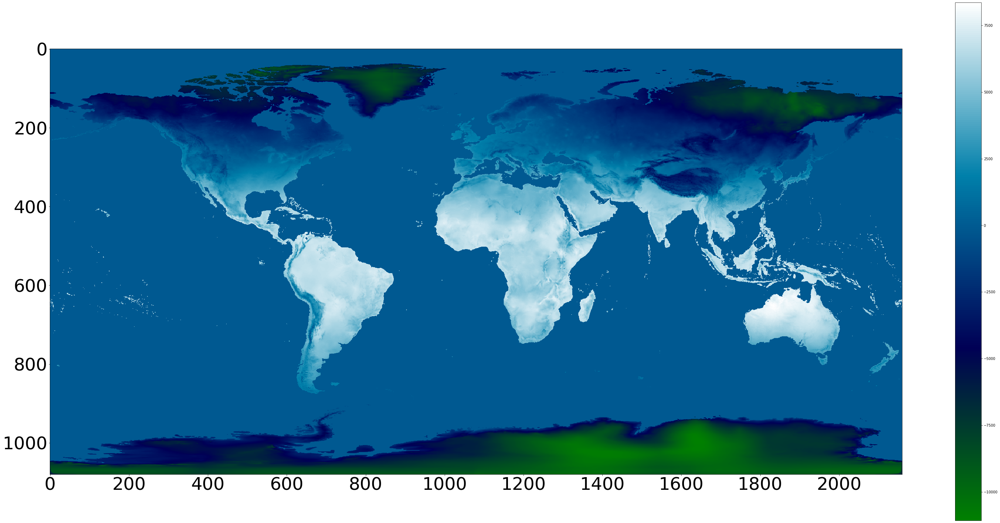

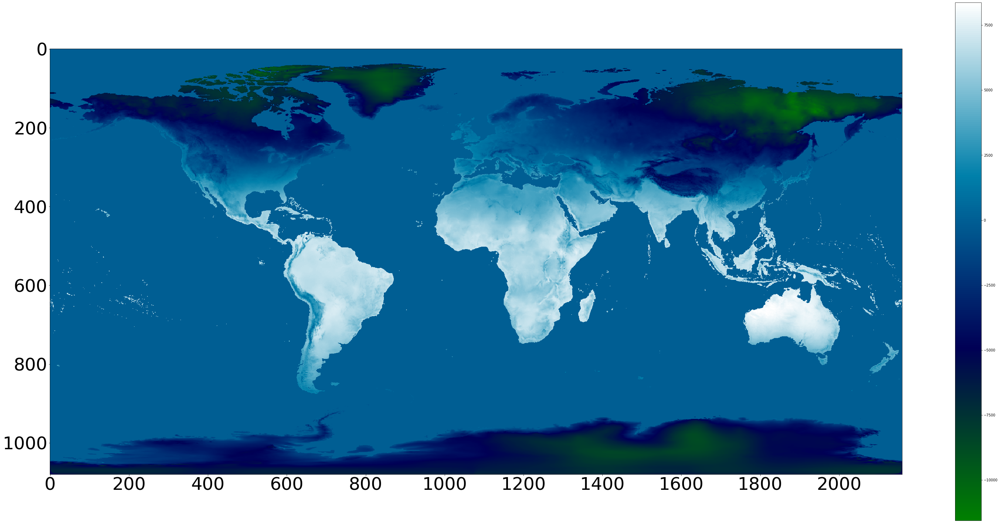

In [10]:
'''
import glob
path = "/content/*.*"
for file in glob.glob(path):
    time.sleep(5)
    print(file)
'''
def plotting(src1):
    array1=src1.read(1)
    b = src1.dataset_mask()
    plt.figure(figsize = (54,27))
    plt.xticks([0,200,400,600,800,1000,1200,1400,1600,1800,2000],fontsize=50)
    plt.yticks([0,200,400,600,800,1000],fontsize=50)
    a3=plt.imshow(b*array1,cmap="ocean",interpolation="none")
    plt.colorbar(a3)
    print (a3)
    time.sleep(5)

src1 = rasterio.open('/content/wc2.1_10m_tavg_01.tif')
plotting(src1)
src1 = rasterio.open('/content/wc2.1_10m_tavg_02.tif')
plotting(src1)
src1 = rasterio.open('/content/wc2.1_10m_tavg_03.tif')
plotting(src1)
src1 = rasterio.open('/content/wc2.1_10m_tavg_04.tif')
plotting(src1)
src1 = rasterio.open('/content/wc2.1_10m_tavg_05.tif')
plotting(src1)
src1 = rasterio.open('/content/wc2.1_10m_tavg_06.tif')
plotting(src1)
src1 = rasterio.open('/content/wc2.1_10m_tavg_07.tif')
plotting(src1)
src1 = rasterio.open('/content/wc2.1_10m_tavg_08.tif')
plotting(src1)
src1 = rasterio.open('/content/wc2.1_10m_tavg_09.tif')
plotting(src1)
src1 = rasterio.open('/content/wc2.1_10m_tavg_10.tif')
plotting(src1)
src1 = rasterio.open('/content/wc2.1_10m_tavg_11.tif')
plotting(src1)
src1 = rasterio.open('/content/wc2.1_10m_tavg_12.tif')
plotting(src1)


    

####Now we map each coordinate with it's temperature and save it in a dictionary monthwise. The cordinate system can be referred from above visualisation.

######January

In [11]:

src1 = rasterio.open('/content/wc2.1_10m_tavg_01.tif')
array1=src1.read(1)
b = src1.dataset_mask()

rows = b.shape[0]
cols = b.shape[1]
print (rows)
print (cols)
Jan={}
for x in range(0, rows):
    for y in range(0,cols):
        if b[x][y]!=0:
            Jan[(x,y)]=array1[x][y]
                    
time.sleep(10)
text_file = open("Jan.txt", "w")
text_file.write(str(Jan))    
text_file.close()


1080
2160


######February

In [12]:
src1 = rasterio.open('/content/wc2.1_10m_tavg_02.tif')
array1=src1.read(1)
b = src1.dataset_mask()

rows = b.shape[0]
cols = b.shape[1]
print (rows)
print (cols)
Feb={}
for x in range(0, rows):
    for y in range(0,cols):
        if b[x][y]!=0:
            Feb[(x,y)]=array1[x][y]
                    
time.sleep(10)
text_file = open("Feb.txt", "w")
text_file.write(str(Feb))    
text_file.close()

1080
2160


######March

In [13]:
src1 = rasterio.open('/content/wc2.1_10m_tavg_03.tif')
array1=src1.read(1)
b = src1.dataset_mask()

rows = b.shape[0]
cols = b.shape[1]
print (rows)
print (cols)
March={}
for x in range(0, rows):
    for y in range(0,cols):
        if b[x][y]!=0:
            March[(x,y)]=array1[x][y]
                    
time.sleep(10)
text_file = open("March.txt", "w")
text_file.write(str(March))    
text_file.close()

1080
2160


######April

In [14]:
src1 = rasterio.open('/content/wc2.1_10m_tavg_04.tif')
array1=src1.read(1)
b = src1.dataset_mask()

rows = b.shape[0]
cols = b.shape[1]
print (rows)
print (cols)
April={}
for x in range(0, rows):
    for y in range(0,cols):
        if b[x][y]!=0:
            April[(x,y)]=array1[x][y]
                    
time.sleep(10)
text_file = open("April.txt", "w")
text_file.write(str(April))    
text_file.close()

1080
2160


######May

In [15]:
src1 = rasterio.open('/content/wc2.1_10m_tavg_05.tif')
array1=src1.read(1)
b = src1.dataset_mask()

rows = b.shape[0]
cols = b.shape[1]
print (rows)
print (cols)
May={}
for x in range(0, rows):
    for y in range(0,cols):
        if b[x][y]!=0:
            May[(x,y)]=array1[x][y]
                    
time.sleep(10)
text_file = open("May.txt", "w")
text_file.write(str(May))    
text_file.close()

1080
2160


######June

In [16]:
src1 = rasterio.open('/content/wc2.1_10m_tavg_06.tif')
array1=src1.read(1)
b = src1.dataset_mask()

rows = b.shape[0]
cols = b.shape[1]
print (rows)
print (cols)
June={}
for x in range(0, rows):
    for y in range(0,cols):
        if b[x][y]!=0:
            June[(x,y)]=array1[x][y]
                    
time.sleep(10)
text_file = open("June.txt", "w")
text_file.write(str(June))    
text_file.close()

1080
2160


######July

In [17]:
src1 = rasterio.open('/content/wc2.1_10m_tavg_07.tif')
array1=src1.read(1)
b = src1.dataset_mask()

rows = b.shape[0]
cols = b.shape[1]
print (rows)
print (cols)
July={}
for x in range(0, rows):
    for y in range(0,cols):
        if b[x][y]!=0:
            July[(x,y)]=array1[x][y]
                    
time.sleep(10)
text_file = open("July.txt", "w")
text_file.write(str(July))    
text_file.close()

1080
2160


######August

In [18]:
src1 = rasterio.open('/content/wc2.1_10m_tavg_08.tif')
array1=src1.read(1)
b = src1.dataset_mask()

rows = b.shape[0]
cols = b.shape[1]
print (rows)
print (cols)
Aug={}
for x in range(0, rows):
    for y in range(0,cols):
        if b[x][y]!=0:
            Aug[(x,y)]=array1[x][y]
                    
time.sleep(10)
text_file = open("Aug.txt", "w")
text_file.write(str(Aug))    
text_file.close()

1080
2160


######September

In [19]:
src1 = rasterio.open('/content/wc2.1_10m_tavg_09.tif')
array1=src1.read(1)
b = src1.dataset_mask()

rows = b.shape[0]
cols = b.shape[1]
print (rows)
print (cols)
Sept={}
for x in range(0, rows):
    for y in range(0,cols):
        if b[x][y]!=0:
            Sept[(x,y)]=array1[x][y]
                    
time.sleep(10)
text_file = open("Sept.txt", "w")
text_file.write(str(Sept))    
text_file.close()

1080
2160


######October

In [20]:
src1 = rasterio.open('/content/wc2.1_10m_tavg_10.tif')
array1=src1.read(1)
b = src1.dataset_mask()

rows = b.shape[0]
cols = b.shape[1]
print (rows)
print (cols)
Oct={}
for x in range(0, rows):
    for y in range(0,cols):
        if b[x][y]!=0:
            Oct[(x,y)]=array1[x][y]
                    
time.sleep(10)
text_file = open("Oct.txt", "w")
text_file.write(str(Oct))    
text_file.close()

1080
2160


######November

In [21]:
src1 = rasterio.open('/content/wc2.1_10m_tavg_11.tif')
array1=src1.read(1)
b = src1.dataset_mask()

rows = b.shape[0]
cols = b.shape[1]
print (rows)
print (cols)
Nov={}
for x in range(0, rows):
    for y in range(0,cols):
        if b[x][y]!=0:
            Nov[(x,y)]=array1[x][y]
                    
time.sleep(10)
text_file = open("Nov.txt", "w")
text_file.write(str(Nov))    
text_file.close()

1080
2160


######December

In [22]:
src1 = rasterio.open('/content/wc2.1_10m_tavg_12.tif')
array1=src1.read(1)
b = src1.dataset_mask()

rows = b.shape[0]
cols = b.shape[1]
print (rows)
print (cols)
Dec={}
for x in range(0, rows):
    for y in range(0,cols):
        if b[x][y]!=0:
            Dec[(x,y)]=array1[x][y]
                    
time.sleep(10)
text_file = open("Dec.txt", "w")
text_file.write(str(Dec))    
text_file.close()

1080
2160
